In [1]:
import os
import sys
sys.path.append('..')
import torch
import numpy as np

import pretorched.visualizers as vutils
from pretorched.models import utils as mutils
import core
import models
from data import VideoFolder, transforms
import torch.nn.functional as F

%load_ext autoreload
%autoreload 2

In [2]:
device = 'cpu' if torch.cuda.is_available() else 'cpu'

In [3]:
data_root = os.environ.get('DATA_ROOT', '')
heatvol_root = os.path.join(data_root, 'DeepfakeDetection', 'heatvols')
datadir = os.path.join(data_root, 'DeepfakeDetection', 'test_facenet_videos')
step = 3

In [4]:
dataset = VideoFolder(datadir, step=step, transform=transforms.get_transform(split='val'))
valid_human_videos = [
    'aomqqjipcp',
    'axfhbpkdlc',
    'ecumyiowzs',
    'eisofhptvk',
    'ekboxwrwuv',
    'etdliwticv',
    'eywdmustbb',
    'gqnaxievjx',
    'hclsparpth',
    'hqzwudvhih',
    'njzshtfmcw',
    'orixbcfvdz',
    'pqthmvwonf',
    'rfwxcinshk',
    'rnfcjxynfa',
]
filenames = []
# for f in dataset.videos_filenames:
dataset.videos_filenames = [f for f in dataset.videos_filenames if os.path.splitext(f)[0] in valid_human_videos]
print(dataset)

Dataset VideoFolder
  Root dir: /data/datasets/DeepfakeDetection/test_facenet_videos
  Number of datapoints: 15
  Transforms (if any): Compose(
                           Compose(
                           ResizeVideo(size=256, interpolation=PIL.Image.BILINEAR)
                           CenterCropVideo(size=(224, 224))
                       )
                           CollectFrames()
                           PILVideoToTensor(rescale=True, ordering='CTHW')
                           NormalizeVideo(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], channel_dim=0)
                       )



In [5]:
name, frames, target = dataset[0]
print(frames.shape)
frames = frames.unsqueeze(0).to(device)[:, :, :90:step]
print(frames.shape)
input = frames.clone()
print(name)
print(input.min(), input.mean(), input.max())

torch.Size([3, 100, 224, 224])
torch.Size([1, 3, 30, 224, 224])
aomqqjipcp.mp4
tensor(-2.0357) tensor(-0.4812) tensor(2.6400)


## Original Frames

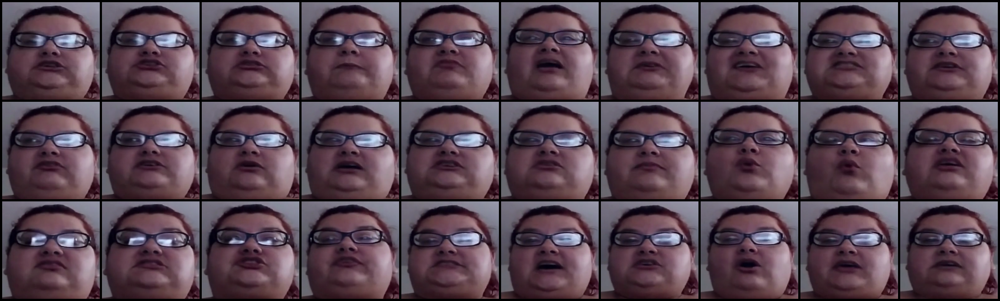

In [6]:
vutils.visualize_samples(frames.squeeze(0).transpose(0, 1), nrow=10)

In [7]:
heatvol_file = os.path.join(heatvol_root, os.path.splitext(name)[0] + '.pt')
heatvol = torch.load(heatvol_file)[:90:step]
print(heatvol.shape)
print(heatvol.unsqueeze(-1).repeat(1, 1, 1, 3).shape)

torch.Size([30, 360, 360])
torch.Size([30, 360, 360, 3])


## Human Attention Maps

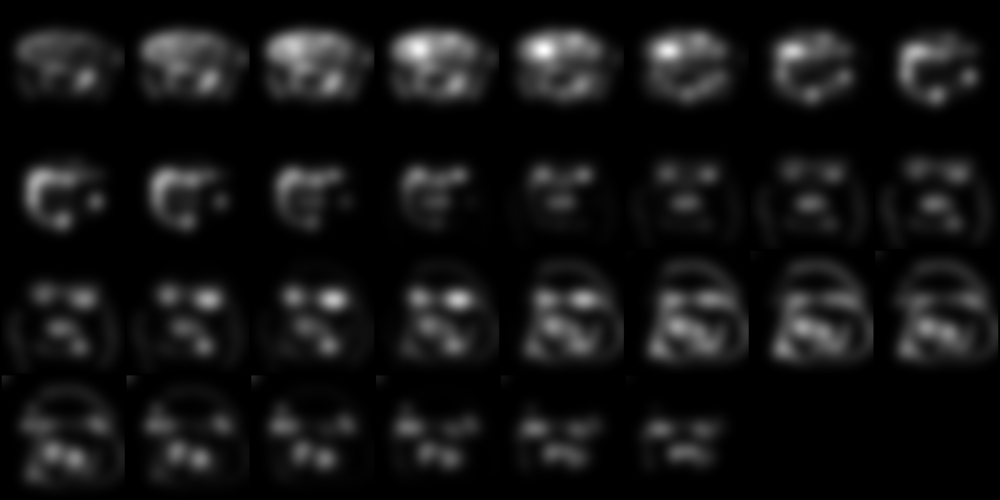

In [8]:
vutils.visualize_samples(heatvol.unsqueeze(1).repeat(1,3, 1, 1))

In [9]:
def apply_heatvol(heatvol, frames, strength=0.15):
    """
    frames: [c, d, h, w]
    """
    out = []
    frames = frames.permute(1, 2, 3, 0).numpy()
    frames -= frames.min()
    frames /= frames.max()
    frames = (frames * 255).astype(np.uint8)
    heatvol = heatvol.numpy()
    # heatvol -= heatvol.min()
    # heatvol /= heatvol.max()
    for v, f in zip(heatvol, frames):
        v -= v.min()
        v /= v.max()
        o = vutils.grad_cam.apply_heatmap(v, f, strength=strength)
        out.append(o)
    return torch.from_numpy(np.stack(out)).permute(0, 3, 1, 2)

## Human Attention maps applied to video

torch.Size([30, 3, 224, 224])


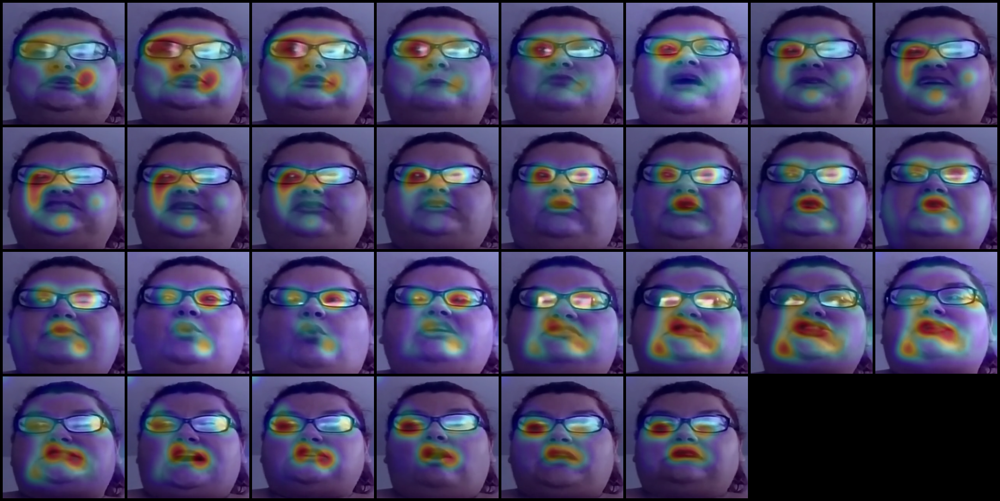

In [10]:
out = apply_heatvol(heatvol, frames.squeeze(0), strength=0.25)
print(out.shape)
vutils.visualize_samples(out)

## Learned Self Attention Maps (WITHOUT Human Supervision)

In [11]:

ckpt_file = 'weights/FrameDetector_samxresnet34_all_ClipSampler_clip_length-16_frame_step-5_init-imagenet-ortho_optim-Ranger_lr-0.001_sched-CosineAnnealingLR_bs-64_best.pth.tar'

basemodel_name = 'samxresnet34'
model = models.AttnFrameDetector(model=core.get_basemodel(basemodel_name), normalize=False, basemodel_name=basemodel_name)
ckpt = torch.load(ckpt_file,  map_location='cpu')
state_dict = mutils.remove_prefix(ckpt['state_dict'])
model.load_state_dict(state_dict)
model = model.to(device)
model.eval()
print()

In [12]:
with torch.no_grad():
    input = input.to(device)
    out, attn_map = model(input)
    attn_map_softmax = F.softmax(attn_map.view(1, attn_map.size(1), -1), dim=-1).view_as(attn_map)


### Attn maps without and with Softmax

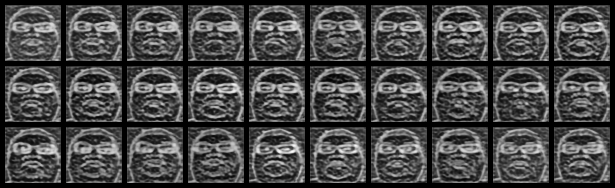

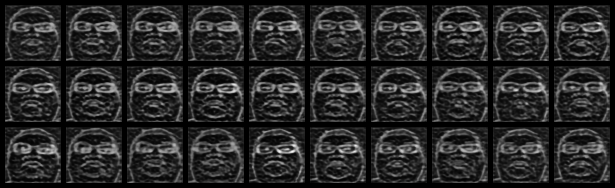

In [13]:
vutils.visualize_samples(attn_map.transpose(0, 1).repeat(1, 3, 1, 1), nrow=10)
vutils.visualize_samples(attn_map_softmax.transpose(0, 1).repeat(1, 3, 1, 1), nrow=10)

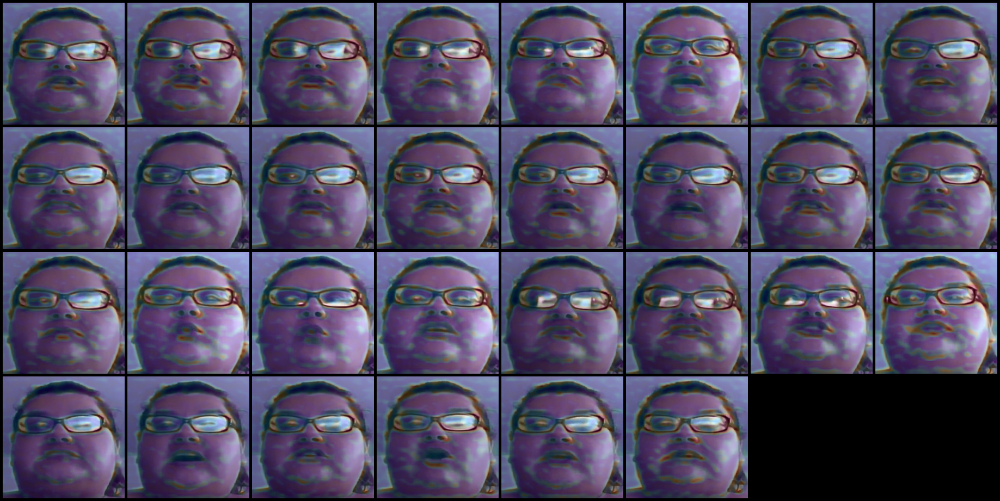

In [14]:
vutils.visualize_samples(apply_heatvol(attn_map_softmax.squeeze(0), frames.squeeze(0)))

## Learned Self Attention Maps (WITH Human Supervision)

In [23]:
ckpt_file = 'weights/HumanHeatvol_AttnFrameDetector_samxresnet34_all_ClipSampler_clip_length-16_frame_step-5_init-imagenet-ortho_optim-Ranger_lr-0.001_sched-CosineAnnealingLR_bs-32_best.pth.tar'
basemodel_name = 'samxresnet34'
model = models.AttnFrameDetector(model=core.get_basemodel(basemodel_name), normalize=False, basemodel_name=basemodel_name)
ckpt = torch.load(ckpt_file,  map_location='cpu')
state_dict = mutils.remove_prefix(ckpt['state_dict'])
model.load_state_dict(state_dict)
model = model.to(device)
model.eval()
print()

In [24]:

with torch.no_grad():
    input = input.to(device)
    out, attn_map = model(input)
    attn_map_softmax = F.softmax(attn_map.view(1, attn_map.size(1), -1), dim=-1).view_as(attn_map)


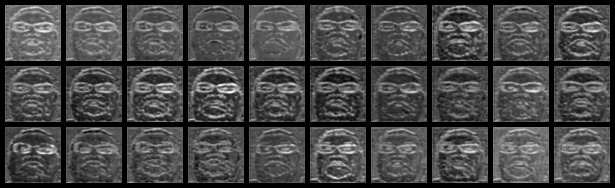

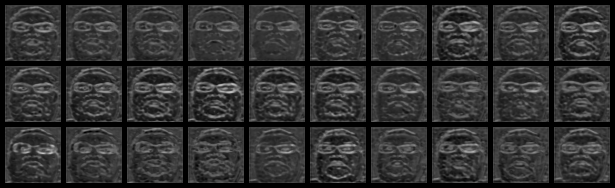

In [25]:
vutils.visualize_samples(attn_map.transpose(0, 1).repeat(1, 3, 1, 1), nrow=10)
vutils.visualize_samples(attn_map_softmax.transpose(0, 1).repeat(1, 3, 1, 1), nrow=10)

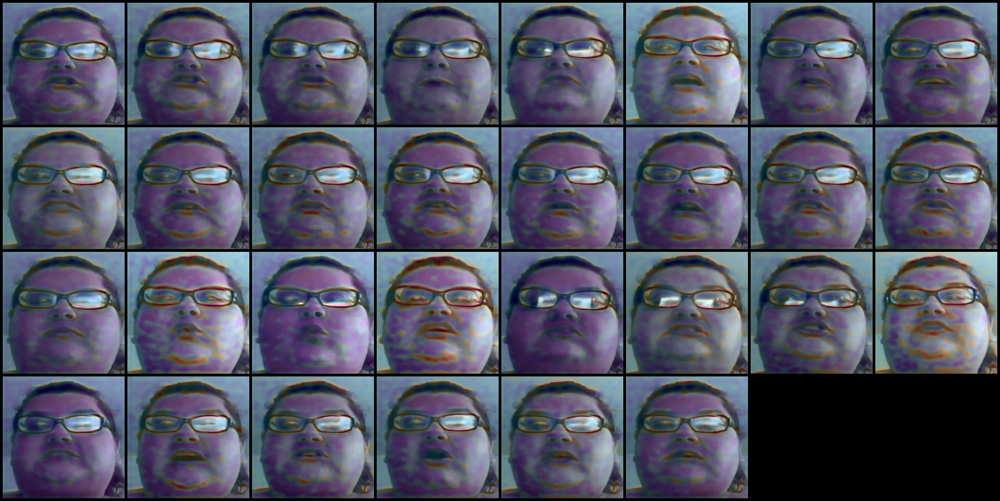

In [26]:
vutils.visualize_samples(apply_heatvol(attn_map_softmax.squeeze(0), frames.squeeze(0)))

## Simple Self Attention

In [19]:
ckpt_file = '../faceforensics_neuraltextures_only/weights/FrameDetector_ssamxresnet18_all_TSNFrameSampler_seg_count-16_init-imagenet-ortho_optim-Ranger_lr-0.001_sched-CosineAnnealingLR_bs-72_best.pth.tar'
model = models.AttnFrameDetector(model=core.get_basemodel('ssamxresnet18'), normalize=False)
ckpt = torch.load(ckpt_file,  map_location='cpu')
state_dict = mutils.remove_prefix(ckpt['state_dict'])
model.load_state_dict(state_dict, strict=False)
model = model.to(device)
model.eval()
print()

In [20]:
with torch.no_grad():
    input = input.to(device)
    out, attn_map = model(input)

## An updated version

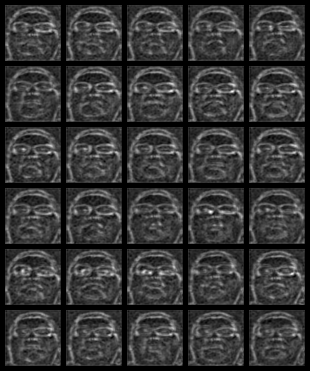

In [21]:
vutils.visualize_samples(attn_map.transpose(0, 1).repeat(1, 3, 1, 1), nrow=5)

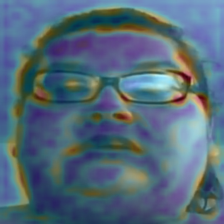

In [22]:
# Convert back to raw image
f = frames[0, :, -1].permute(1, 2, 0).cpu().numpy() 
f -= f.min()
f /= f.max()
f = (f * 255).astype(np.uint8)

# Normalize corresponding attn map
a = attn_map[0, -1].cpu().numpy()
a -= a.min()
a /= a.max()
vutils.imshow(vutils.grad_cam.apply_heatmap(a, f))